## Environmental set up

In [1]:
# env set up
# source /g/data/oe9/login_script.sh
# source activate geo
# jupyter notebook
import numpy as np
import glob
import xarray as xr
import pandas as pd

import holoviews as hv
import geoviews as gv
import geoviews.feature as gf

import matplotlib
import matplotlib.pyplot as plt

hv.notebook_extension()

# year = np.arange(2000,2017)
# for yeari in year:
#     ncpath = '/g/data/oe9/user/rg6346/NDVI_stack/MOD13A1_NDVI_EVI_'+str(yeari)+'.nc'


In [ ]:
ndvi_chunk=[]
# mask data for MDB only
# mask = xr.open_dataset('/g/data/oe9/project/team-drip/MDB_MASK/MASK_ARRAY.nc')
year = np.arange(2000,2017)
for yeari in year:
    ncpath = '/g/data/oe9/user/rg6346/NDVI_stack/MOD13A1_NDVI_EVI_'+str(yeari)+'.nc'
    # read yearly dataset in nc
    yearnc = xr.open_dataset(ncpath, autoclose = True)
    # drop day of year dimention
    yearly = yearnc.drop(1, dim = 'band')
    # mask data for MDB only
    mask = xr.open_dataset('/g/data/oe9/project/team-drip/MDB_MASK/MASK_ARRAY.nc', autoclose = True)
    yearvi = yearly.where(mask, drop=True)
#     yearvi = yearly#.where(mask, drop=True)
    # rename the variables
    yearvi = yearvi.rename({'__xarray_dataarray_variable__': 'ndvi_evi'})
    yearvi = yearvi.rename({'y': 'lat'})
    yearvi = yearvi.rename({'x': 'long'})
    # select NDVI and EVI
    ndvi_t = yearvi.ndvi_evi.isel(band=0)#/10000
    evi_t  = yearvi.ndvi_evi.isel(band=1)#/10000
    # drop where NDVI EVI is negative
    ndvi_p = ndvi_t.where(ndvi_t>=0, np.nan)
    evi_p  = evi_t.where(evi_t>=0, np.nan)
    # save masked file to 
    ndvi_outpath = '/g/data/oe9/user/rg6346/VI_mask_nc/NDVI/NDVI_'+str(yeari)+'.nc'
    ndvi_p.to_netcdf(ndvi_outpath, mode = 'w')
    evi_outpath = '/g/data/oe9/user/rg6346/VI_mask_nc/EVI/EVI_'+str(yeari)+'.nc'
    evi_p.to_netcdf(evi_outpath, mode = 'w')
    del yearnc, yearvi, ndvi_t, ndvi_p, evi_t, evi_p
    #  to chunk
#     ndvi_chunk.append(ndvi_p.chunk(chunks={'lat':10}))
    

In [19]:
# stack chunked data from list: ndvi_chunk
NDVI = xr.concat([i for i in ndvi_chunk], dim = 'time')

In [24]:
# save to pickle file
import pickle
output = open('/g/data/oe9/project/team-drip/NDVI_EVI_MODIS_MDB/VI_pkl/pickle_ndvi.pkl', 'wb')
pickle.dump(NDVI, output)
output.close()


In [10]:
NDVI_yearly.time#.plot.imshow(col='time', robust = True, col_wrap=4, cmap = 'RdYlGn')

<xarray.DataArray 'time' (time: 23)>
array(['2001-01-01T00:00:00.000000000', '2001-01-17T00:00:00.000000000',
       '2001-02-02T00:00:00.000000000', '2001-02-18T00:00:00.000000000',
       '2001-03-06T00:00:00.000000000', '2001-03-22T00:00:00.000000000',
       '2001-04-07T00:00:00.000000000', '2001-04-23T00:00:00.000000000',
       '2001-05-09T00:00:00.000000000', '2001-05-25T00:00:00.000000000',
       '2001-06-10T00:00:00.000000000', '2001-06-26T00:00:00.000000000',
       '2001-07-12T00:00:00.000000000', '2001-07-28T00:00:00.000000000',
       '2001-08-13T00:00:00.000000000', '2001-08-29T00:00:00.000000000',
       '2001-09-14T00:00:00.000000000', '2001-09-30T00:00:00.000000000',
       '2001-10-16T00:00:00.000000000', '2001-11-01T00:00:00.000000000',
       '2001-11-17T00:00:00.000000000', '2001-12-03T00:00:00.000000000',
       '2001-12-19T00:00:00.000000000'], dtype='datetime64[ns]')
Coordinates:
    band     int64 2
  * time     (time) datetime64[ns] 2001-01-01 2001-01-17 2001

In [15]:
#     mask = xr.open_dataset('/g/data/oe9/project/team-drip/MDB_MASK/MASK_ARRAY.nc')
#     yearvi = yearnc.where(mask, drop=True)
#     yearvi

<xarray.Dataset>
Dimensions:                        (x: 3346, y: 3147)
Coordinates:
    band                           int64 ...
  * y                              (y) float64 -24.59 -24.59 -24.6 -24.6 ...
  * x                              (x) float64 138.6 138.6 138.6 138.6 138.6 ...
    time                           datetime64[ns] ...
Data variables:
    __xarray_dataarray_variable__  (y, x) uint8 ...

In [4]:
# ds_all=ds_all.rename({'__xarray_dataarray_variable__': 'ndvi'})
# yearvi = yearvi.rename({'__xarray_dataarray_variable__': 'ndvi_evi'})
# yearvi = yearvi.rename({'y': 'lat'})
# yearvi = yearvi.rename({'x': 'long'})
# yearvi

<xarray.Dataset>
Dimensions:   (band: 3, lat: 3147, long: 3344, time: 23)
Coordinates:
  * band      (band) int64 1 2 3
  * lat       (lat) float64 -24.59 -24.59 -24.6 -24.6 -24.6 -24.61 -24.61 ...
  * long      (long) float64 138.6 138.6 138.6 138.6 138.6 138.6 138.6 138.6 ...
  * time      (time) datetime64[ns] 2016-01-01 2016-01-17 2016-02-02 ...
Data variables:
    ndvi_evi  (time, band, lat, long) float64 nan nan nan nan nan nan nan ...

In [7]:
# %%time
# note to select band
# 0 : day of year
# 1 : NDVI
# 2 : EVI
# ndvi_t = yearvi.ndvi_evi.isel(band=1)/10000 
# ndvi_t
# ndvi_t[np.where(ndvi_t<0)] = np.nan
# ndvi_t[ndvi_t<0] = np.nan
# ndvi.plot.imshow(col='time', robust = True, col_wrap=4, cmap = 'RdYlGn')

CPU times: user 752 ms, sys: 433 ms, total: 1.18 s
Wall time: 1.18 s


In [16]:
# select where NDVI is positive
idndvi = ndvi_t.where(ndvi_t>=0, np.nan)
# test the mini
idndvi
# idndvi.plot.imshow(col='time', robust = True, col_wrap=4, cmap = 'RdYlGn')

<xarray.DataArray 'ndvi_evi' (time: 23, lat: 3147, long: 3344)>
array([[[ nan,  nan, ...,  nan,  nan],
        [ nan,  nan, ...,  nan,  nan],
        ..., 
        [ nan,  nan, ...,  nan,  nan],
        [ nan,  nan, ...,  nan,  nan]],

       [[ nan,  nan, ...,  nan,  nan],
        [ nan,  nan, ...,  nan,  nan],
        ..., 
        [ nan,  nan, ...,  nan,  nan],
        [ nan,  nan, ...,  nan,  nan]],

       ..., 
       [[ nan,  nan, ...,  nan,  nan],
        [ nan,  nan, ...,  nan,  nan],
        ..., 
        [ nan,  nan, ...,  nan,  nan],
        [ nan,  nan, ...,  nan,  nan]],

       [[ nan,  nan, ...,  nan,  nan],
        [ nan,  nan, ...,  nan,  nan],
        ..., 
        [ nan,  nan, ...,  nan,  nan],
        [ nan,  nan, ...,  nan,  nan]]])
Coordinates:
    band     int64 2
  * lat      (lat) float64 -24.59 -24.59 -24.6 -24.6 -24.6 -24.61 -24.61 ...
  * long     (long) float64 138.6 138.6 138.6 138.6 138.6 138.6 138.6 138.6 ...
  * time     (time) datetime64[ns] 2016-01-0

In [9]:
#
ndvi_nc = glob.glob('/g/data/oe9/user/rg6346/NDVI_stack/*.nc')
ndvi_nc.sort()
ndvi_nc
# yearnc = xr.open_dataset(ncpath)
# year = np.arange(2000,2002)
# for yeari in year:
#     ncpath = '/g/data/oe9/user/rg6346/NDVI_stack/MOD13A1_NDVI_EVI_'+str(yeari)+'.nc'
#     NDVI_all = xr.concat([xr.open_dataset(ncpath)])

['/g/data/oe9/user/rg6346/NDVI_stack/MOD13A1_NDVI_EVI_2000.nc',
 '/g/data/oe9/user/rg6346/NDVI_stack/MOD13A1_NDVI_EVI_2001.nc',
 '/g/data/oe9/user/rg6346/NDVI_stack/MOD13A1_NDVI_EVI_2002.nc',
 '/g/data/oe9/user/rg6346/NDVI_stack/MOD13A1_NDVI_EVI_2003.nc',
 '/g/data/oe9/user/rg6346/NDVI_stack/MOD13A1_NDVI_EVI_2004.nc',
 '/g/data/oe9/user/rg6346/NDVI_stack/MOD13A1_NDVI_EVI_2005.nc',
 '/g/data/oe9/user/rg6346/NDVI_stack/MOD13A1_NDVI_EVI_2006.nc',
 '/g/data/oe9/user/rg6346/NDVI_stack/MOD13A1_NDVI_EVI_2007.nc',
 '/g/data/oe9/user/rg6346/NDVI_stack/MOD13A1_NDVI_EVI_2008.nc',
 '/g/data/oe9/user/rg6346/NDVI_stack/MOD13A1_NDVI_EVI_2009.nc',
 '/g/data/oe9/user/rg6346/NDVI_stack/MOD13A1_NDVI_EVI_2010.nc',
 '/g/data/oe9/user/rg6346/NDVI_stack/MOD13A1_NDVI_EVI_2011.nc',
 '/g/data/oe9/user/rg6346/NDVI_stack/MOD13A1_NDVI_EVI_2012.nc',
 '/g/data/oe9/user/rg6346/NDVI_stack/MOD13A1_NDVI_EVI_2013.nc',
 '/g/data/oe9/user/rg6346/NDVI_stack/MOD13A1_NDVI_EVI_2014.nc',
 '/g/data/oe9/user/rg6346/NDVI_stack/MOD

In [46]:
# filenm = pd.DataFrame()
# filenm ['name']=ndvi_nc
# list(filenm.name)

['/g/data/oe9/user/rg6346/NDVI_stack/MOD13A1_NDVI_EVI_2000.nc',
 '/g/data/oe9/user/rg6346/NDVI_stack/MOD13A1_NDVI_EVI_2001.nc',
 '/g/data/oe9/user/rg6346/NDVI_stack/MOD13A1_NDVI_EVI_2002.nc',
 '/g/data/oe9/user/rg6346/NDVI_stack/MOD13A1_NDVI_EVI_2003.nc',
 '/g/data/oe9/user/rg6346/NDVI_stack/MOD13A1_NDVI_EVI_2004.nc',
 '/g/data/oe9/user/rg6346/NDVI_stack/MOD13A1_NDVI_EVI_2005.nc',
 '/g/data/oe9/user/rg6346/NDVI_stack/MOD13A1_NDVI_EVI_2006.nc',
 '/g/data/oe9/user/rg6346/NDVI_stack/MOD13A1_NDVI_EVI_2007.nc',
 '/g/data/oe9/user/rg6346/NDVI_stack/MOD13A1_NDVI_EVI_2008.nc',
 '/g/data/oe9/user/rg6346/NDVI_stack/MOD13A1_NDVI_EVI_2009.nc',
 '/g/data/oe9/user/rg6346/NDVI_stack/MOD13A1_NDVI_EVI_2010.nc',
 '/g/data/oe9/user/rg6346/NDVI_stack/MOD13A1_NDVI_EVI_2011.nc',
 '/g/data/oe9/user/rg6346/NDVI_stack/MOD13A1_NDVI_EVI_2012.nc',
 '/g/data/oe9/user/rg6346/NDVI_stack/MOD13A1_NDVI_EVI_2013.nc',
 '/g/data/oe9/user/rg6346/NDVI_stack/MOD13A1_NDVI_EVI_2014.nc',
 '/g/data/oe9/user/rg6346/NDVI_stack/MOD

In [18]:
NDVI_year = xr.concat([xr.open_dataset(nc, chunks={'x': 10}) for nc in ndvi_nc], dim = 'time') 
NDVI_year

<xarray.Dataset>
Dimensions:                        (band: 3, time: 388, x: 3346, y: 3147)
Coordinates:
  * band                           (band) int64 1 2 3
  * y                              (y) float64 -24.59 -24.59 -24.6 -24.6 ...
  * x                              (x) float64 138.6 138.6 138.6 138.6 138.6 ...
  * time                           (time) datetime64[ns] 2000-02-18 ...
Data variables:
    __xarray_dataarray_variable__  (time, band, y, x) int16 dask.array<shape=(388, 3, 3147, 3346), chunksize=(20, 3, 3147, 10)>

In [19]:
# NDVI_year.to_netcdf("./")
aa=NDVI_year.isel(band=1)#.plot()
aa

<xarray.Dataset>
Dimensions:                        (time: 388, x: 3346, y: 3147)
Coordinates:
    band                           int64 2
  * y                              (y) float64 -24.59 -24.59 -24.6 -24.6 ...
  * x                              (x) float64 138.6 138.6 138.6 138.6 138.6 ...
  * time                           (time) datetime64[ns] 2000-02-18 ...
Data variables:
    __xarray_dataarray_variable__  (time, y, x) int16 dask.array<shape=(388, 3147, 3346), chunksize=(20, 3147, 10)>

ValueError: zero-size array to reduction operation minimum which has no identity

In [39]:
filenm = pd.DataFrame()
filenm ['name']=ndvi_nc
filenm.head()
year = np.arange(2000,2017)
for yeari in year:
    Y = list(filenm.name[filenm.name.str.contains(str(yeari))])
    NDVI_year = xr.concat([xr.open_dataset(nc, chunks={'x': 10}) for nc in Y]) 
NDVI_year

/g/data/oe9/software/anaconda/envs/geo/lib/python3.6/site-packages/ipykernel_launcher.py:7: FutureWarning: the `dim` argument to `concat` will be required in a future version of xarray; for now, setting it to the old default of 'concat_dim'
  import sys


<xarray.Dataset>
Dimensions:                        (band: 3, concat_dims: 1, time: 23, x: 3346, y: 3147)
Coordinates:
  * band                           (band) int64 1 2 3
  * y                              (y) float64 -24.59 -24.59 -24.6 -24.6 ...
  * x                              (x) float64 138.6 138.6 138.6 138.6 138.6 ...
  * time                           (time) datetime64[ns] 2016-01-01 ...
Dimensions without coordinates: concat_dims
Data variables:
    __xarray_dataarray_variable__  (concat_dims, time, band, y, x) int16 dask.array<shape=(1, 23, 3, 3147, 3346), chunksize=(1, 23, 3, 3147, 10)>

### Animation of NDVI in one year

In [11]:
%opts Image {+framewise} [colorbar=True]
%output max_frames=1000 
%output size=200
%opts Image [projection=crs.Miller()] (cmap='Greens')

In [12]:
kdims = ['time', 'long', 'lat']
vdims = ['ndvi']
sub_gv = gv.Dataset(ndvi_t, kdims=kdims, vdims=vdims)


CPU times: user 83 ms, sys: 3 ms, total: 86 ms
Wall time: 83 ms


:HoloMap   [time]
   :Image   [long,lat]   (ndvi_evi)
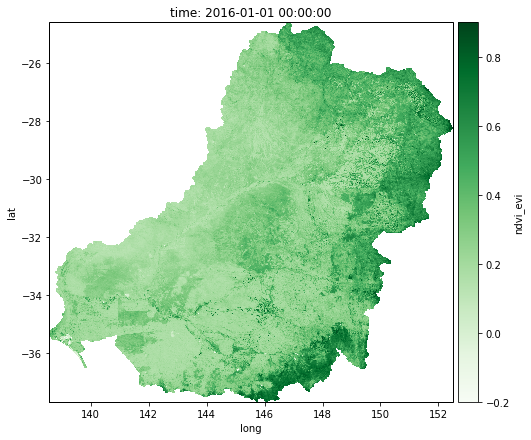
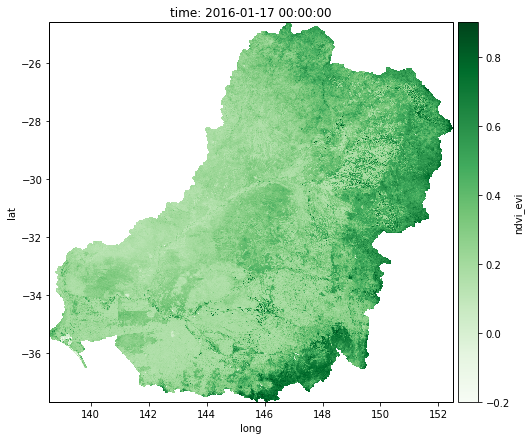
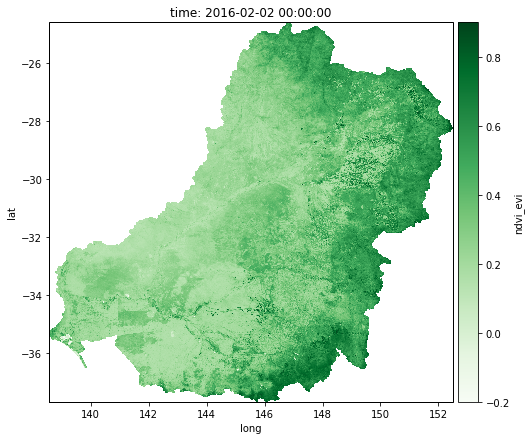
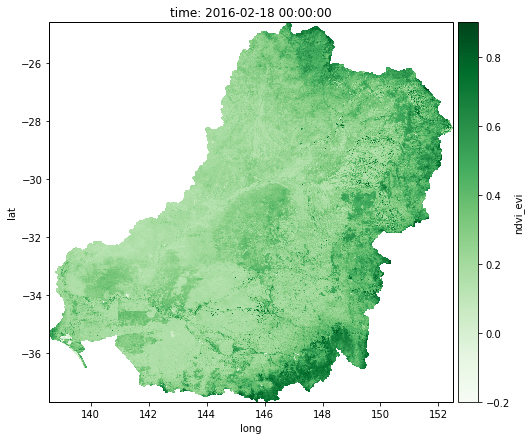
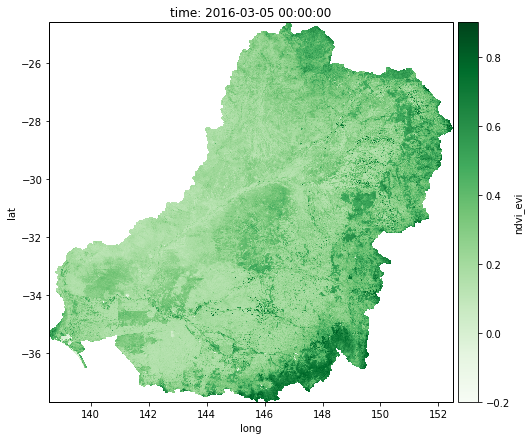
...
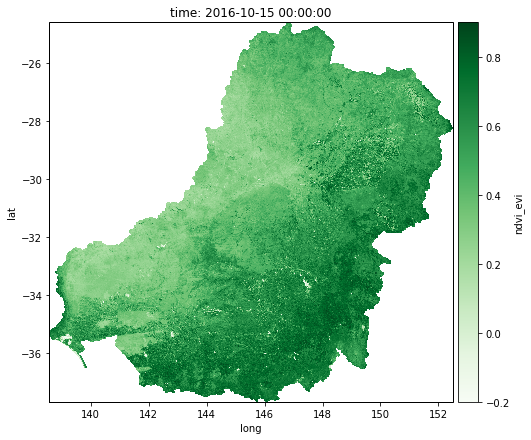
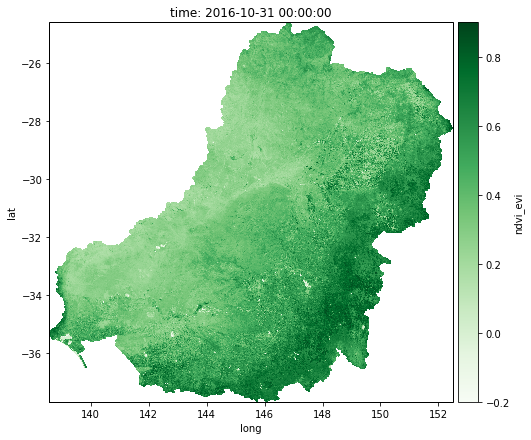
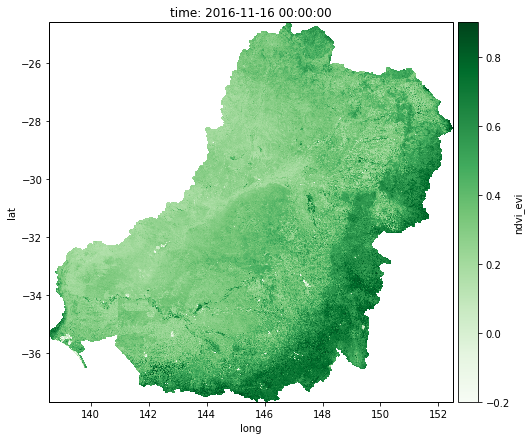
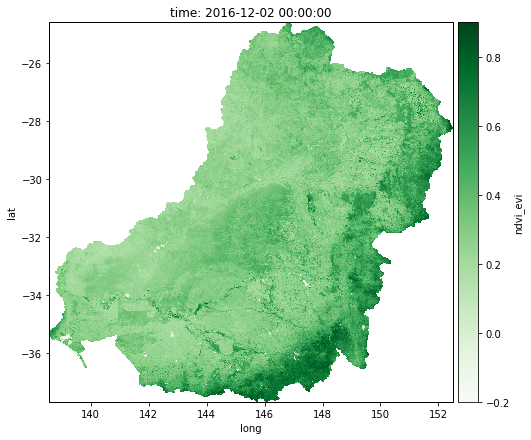
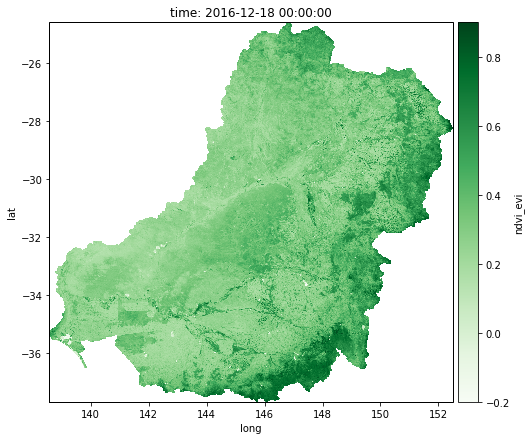

In [13]:
%%time
sub_gv.to(gv.Image, ['long', 'lat'])

### compare with Jen's tail subset

In [37]:
%%time
ndvi_sub_t=ndvi_t.sel(lat=slice(-30.1, -31),long=slice(148.9,150.6)) 
ndvi_sub_t.load()

CPU times: user 2 ms, sys: 1e+03 µs, total: 3 ms
Wall time: 2.31 ms


In [38]:
sub1 = gv.Dataset(ndvi_sub_t, kdims=kdims, vdims=vdims)

:HoloMap   [time]
   :Image   [long,lat]   (ndvi_evi)
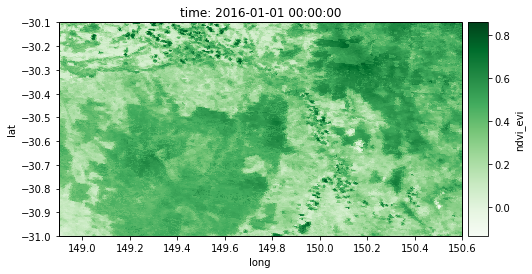
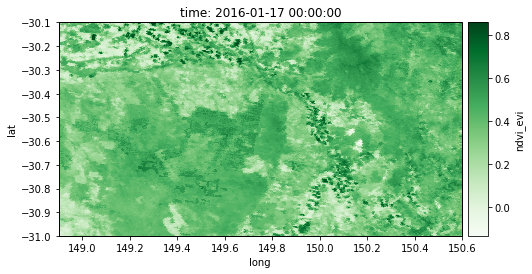
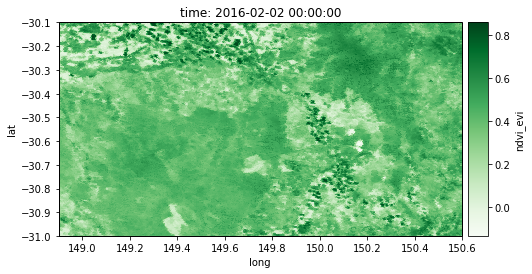
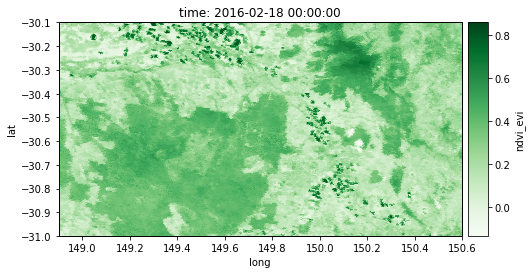
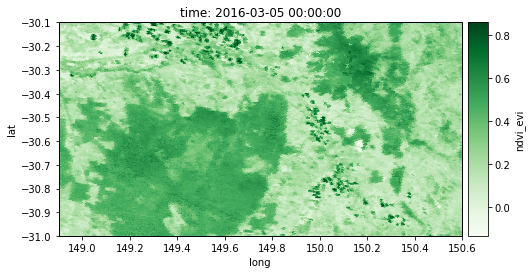
...
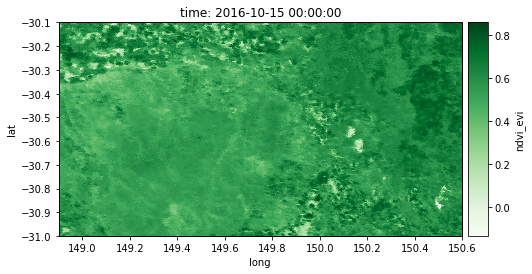
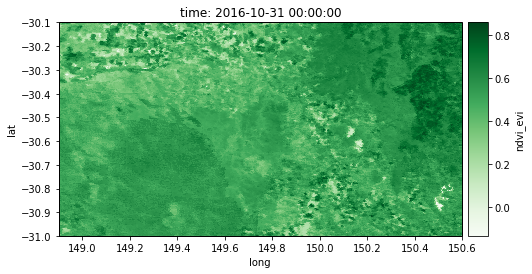
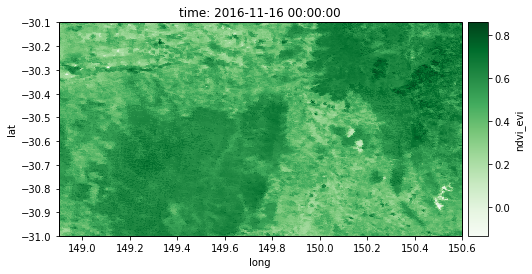
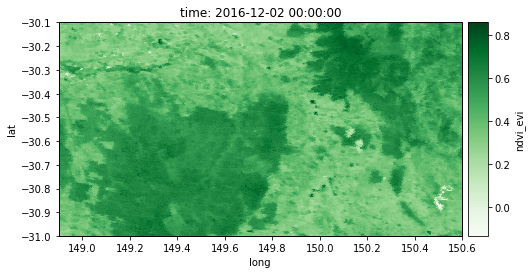
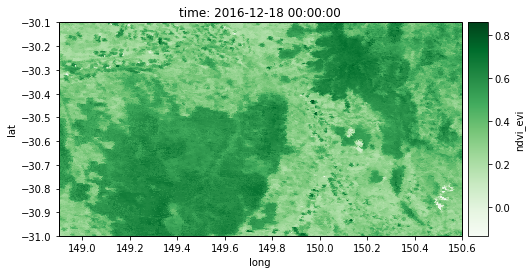

In [39]:
sub1.to(gv.Image, ['long', 'lat'])

### Time Series Analysis

<xarray.DataArray 'ndvi_evi' (time: 23, lat: 3147, long: 3346)>
array([[[ 0.2029,  0.2288, ...,  0.    ,  0.    ],
        [ 0.202 ,  0.2055, ...,  0.    ,  0.    ],
        ..., 
        [ 0.    ,  0.    , ...,  0.    ,  0.    ],
        [ 0.    ,  0.    , ...,  0.    ,  0.    ]],

       [[ 0.1976,  0.206 , ...,  0.    ,  0.    ],
        [ 0.203 ,  0.203 , ...,  0.    ,  0.    ],
        ..., 
        [ 0.    ,  0.    , ...,  0.    ,  0.    ],
        [ 0.    ,  0.    , ...,  0.    ,  0.    ]],

       ..., 
       [[ 0.1804,  0.1804, ...,  0.    ,  0.    ],
        [ 0.1859,  0.186 , ...,  0.    ,  0.    ],
        ..., 
        [ 0.    ,  0.    , ...,  0.    ,  0.    ],
        [ 0.    ,  0.    , ...,  0.    ,  0.    ]],

       [[ 0.1896,  0.1933, ...,  0.    ,  0.    ],
        [ 0.1906,  0.1885, ...,  0.    ,  0.    ],
        ..., 
        [ 0.    ,  0.    , ...,  0.    ,  0.    ],
        [ 0.    ,  0.    , ...,  0.    ,  0.    ]]])
Coordinates:
    band     int64 2
  * lat  

array([1, 2, 3])

/g/data/oe9/software/anaconda/envs/geo/lib/python3.6/site-packages/xarray/core/dtypes.py:23: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if np.issubdtype(dtype, float):
/g/data/oe9/software/anaconda/envs/geo/lib/python3.6/site-packages/xarray/core/dtypes.py:25: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  elif np.issubdtype(dtype, int):


MemoryError: 

<xarray.DataArray '__xarray_dataarray_variable__' ()>
array(-2000.)
Coordinates:
    band     int64 3